#  `satn_to_movie` 

Produces a movie of the invasion sequence from `ibip filter`. This method can be applied for visualizing image-based invasion percolation algorithm.

In [20]:
import matplotlib.pyplot as plt
import numpy as np
import porespy as ps
import inspect
from IPython.display import HTML
ps.visualization.set_mpl_style()
inspect.signature(ps.visualization.satn_to_movie)

<Signature (im, satn, cmap='viridis', c_under='grey', c_over='white', v_under=0.001, v_over=1.0, fps=10, repeat=True)>

## `im`

The input image is a Boolean image `True` values indicating the void voxels and `False` for solid. Let's create a test image:

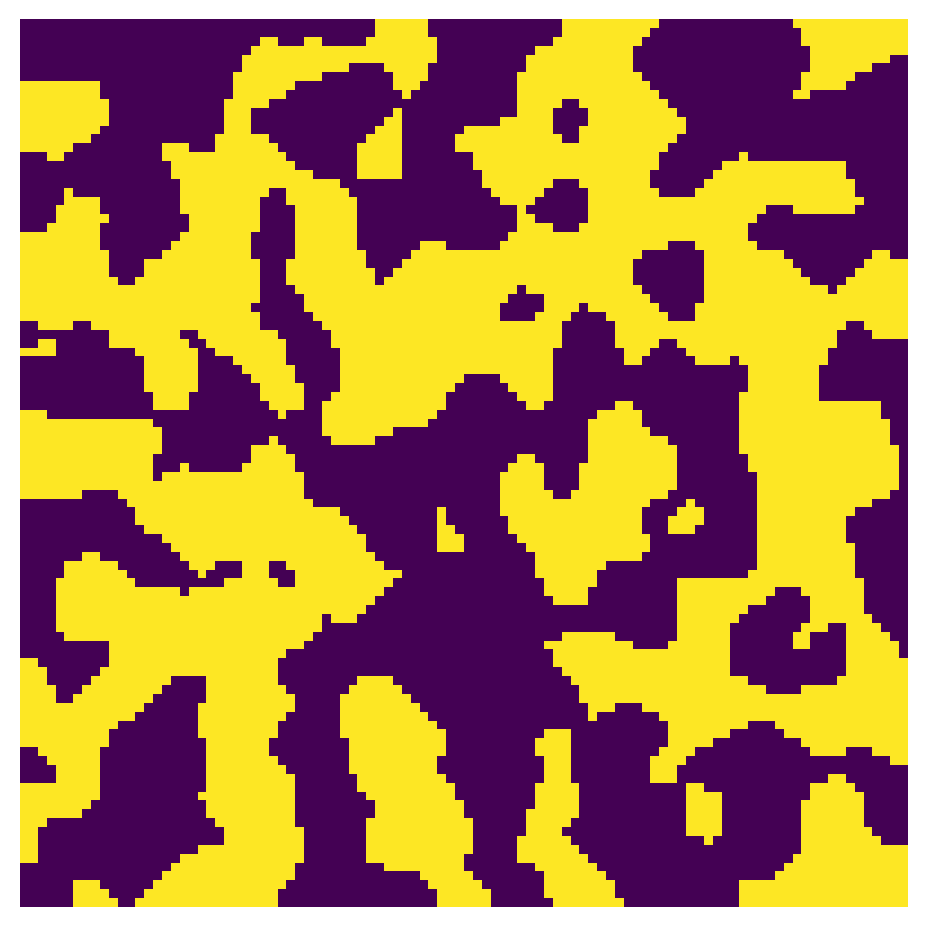

In [21]:
np.random.seed(10)
im = ps.generators.blobs(shape=[100,100], blobiness=1)
fig, ax = plt.subplots()
ax.imshow(im, origin='lower', interpolation='none')
ax.axis(False);

## `satn`

The saturation image can be generated from `ibip` data using `seq_to_satn` method. The `satn` is the image of porous material where each voxel indicates the global saturation at which it was invaded. Voxels with 0 values indicate solid and and -1 indicate uninvaded.

In [22]:
bd = np.zeros_like(im, dtype=bool)
bd[:, 0] = 1
bd *= im
out = ps.filters.ibip(im=im, inlets=bd)
inv_seq, inv_size = out.inv_sequence, out.inv_sizes
satn = ps.filters.seq_to_satn(seq=inv_seq)

C:\Users\jeff\AppData\Local\Temp\ipykernel_20432\2135606513.py:4: DeprecationWarning: Call to deprecated function (or staticmethod) ibip. (The ibip function will be moved to the ``simulations`` module in a future version)
  out = ps.filters.ibip(im=im, inlets=bd)


  0%|          | 0/9999 [00:00<?, ?it/s]

Now we can create an animation of the invasion sequence using `satn_to_movie`: (To save animation as a file and for visualizing use `animation.save`)

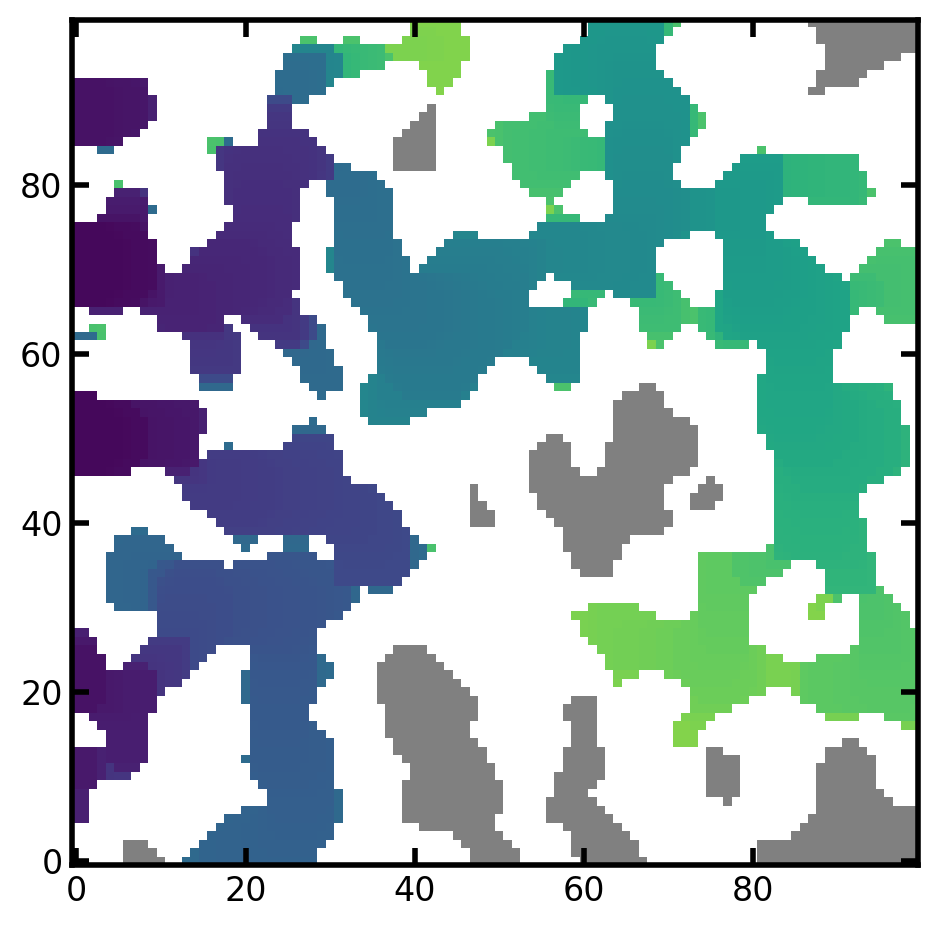

In [23]:
mov = ps.visualization.satn_to_movie(im=im, satn=satn)
mov_image_based_ip = mov.to_jshtml()

In [24]:
HTML(mov_image_based_ip)

## `cmap`

The Colormap used to map invasion sequence values to colors. By default the cmap is 'viridis'.

  0%|          | 0/390 [00:00<?, ?it/s]

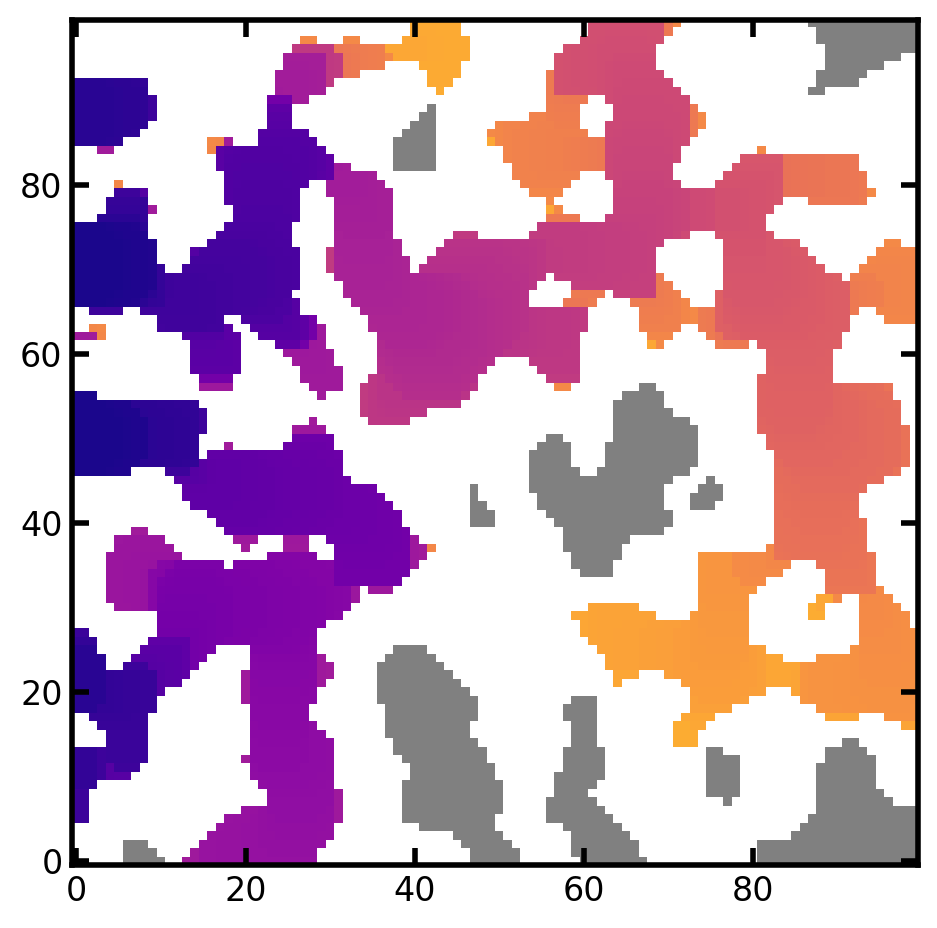

In [25]:
mov = ps.visualization.satn_to_movie(im=im, satn=satn, cmap='plasma')
image_based_ip_cmap = mov.to_jshtml()

In [26]:
HTML(image_based_ip_cmap)

## `c_under`

Colormap to be assigned to the lowest color bound (under color) in the color map. The voxeled colored by `c_under` are the uninvaded void space. The default under color is grey.

In [27]:
mov = ps.visualization.satn_to_movie(im=im, satn=satn, c_under='green')
image_based_ip_c_under = mov.to_jshtml()

  0%|          | 0/390 [00:00<?, ?it/s]

In [ ]:
HTML(image_based_ip_c_under)

## `c_over`

Colormap to be assigned to the highest color bound (over color) in the color map. The voxeled colored by `c_overer` are the solid phase. The default over color is white.

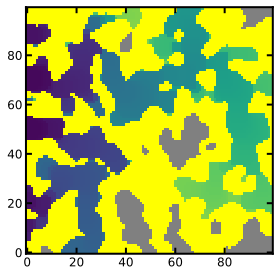

In [ ]:
mov = ps.visualization.satn_to_movie(im=im, satn=satn, c_over='yellow')
image_based_ip_c_over = mov.to_jshtml()

In [ ]:
HTML(image_based_ip_c_over)

## `v_under`

This is the lowest bound of `satn` data range that the colormap covers. By default, the `v_under` is 0.001.

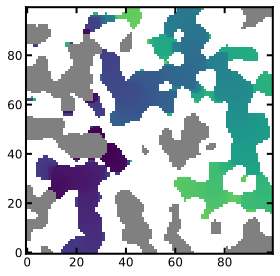

In [ ]:
mov = ps.visualization.satn_to_movie(im=im, satn=satn, v_under=0.2)
image_based_ip_v_under = mov.to_jshtml()

In [ ]:
HTML(image_based_ip_v_under)

## `v_over`

This is the highest bound of `satn` data range that the colormap covers. By default, the `v_over` is 1.

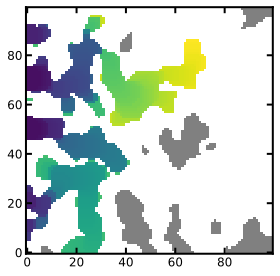

In [ ]:
mov = ps.visualization.satn_to_movie(im=im, satn=satn, v_over=0.5)
image_based_ip_v_over = mov.to_jshtml()

In [ ]:
HTML(image_based_ip_v_over)